In [484]:
import sympy as smp 
import numpy as np 
import matplotlib.pyplot as plt 
from scipy import integrate
from matplotlib import animation
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.animation import PillowWriter
from IPython.display import HTML

### Produce the symbolic representation

In [2]:
L = smp.symbols('L')
g = smp.symbols('g')
t = smp.symbols('t') 

#### Make the symbolic representation for the differential equations 


In [3]:
theta = smp.symbols(r'\theta_1', cls=smp.Function)
theta  = theta(t) 
theta_d = smp.diff(theta ,t)
theta_dd = smp.diff(theta_d ,t)

In [4]:
## The equation for motion 
EUL = L**2*theta_dd + g*L*smp.sin(theta)
EUL 

L**2*Derivative(\theta_1(t), (t, 2)) + L*g*sin(\theta_1(t))

#### Make the representation of this non-linear second order ODE into a 2 first order ODE by substitution 
$$
\frac{d(\theta)}{dt} = z
$$

$$
\frac{d(z)}{dt} = - \frac{g}{l} \sin(\theta)  
$$

This is an example of a coupled ODE. Therefore Python needs to solve this simultaneously. 

In [365]:
## To solve for the coupled ODEs 
L1 = 0.9939608115313338
def dSdt(theta, S, l=L1 ,g = 9.81):
    theta, z = S
    return [z, (-g/l) * np.sin(theta)]
 
the_0 = 6
z_0 = 0 
S_0 = (np.deg2rad(the_0), z_0)
t = np.linspace(0, 60, 600) 
sol = integrate.odeint(dSdt, y0=S_0, t=t, tfirst=True)

    

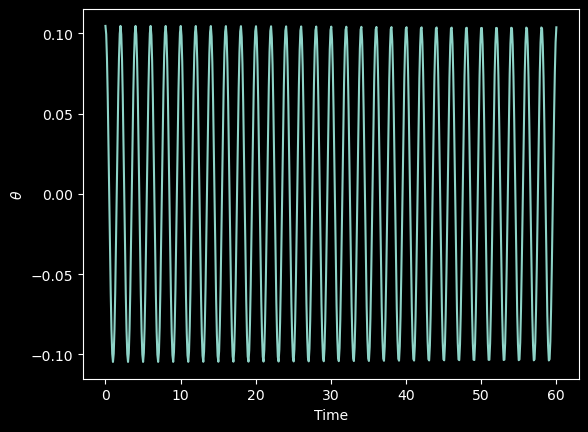

In [366]:
the_sol = sol.T[0]

def get_positions(t, the1, L):
    x = L * np.sin(the1)
    y = L * np.cos(the1)
    return x, y 
    
x1, y1 = get_positions(t, the_sol, L1)
## Drawing the plots 
plt.style.use('dark_background')
plt.xlabel('Time') 
plt.ylabel(r'$\theta$')
plt.plot(t, the_sol)
plt.show() 

#### Make the pendulum animation here  

In [70]:
def animate(i):
    ln1.set_data([0 , x1[i]], [0 , -y1[i]])
    
fig, ax = plt.subplots(1,1, figsize=(8,8))
ax.set_facecolor('k')
ax.get_xaxis().set_ticks([])    # enable this to hide x axis ticks
ax.get_yaxis().set_ticks([])    # enable this to hide y axis ticks
ln1, = plt.plot([], [], 'ro--', lw=3, markersize=8)
ax.set_ylim(-4,4)
ax.set_xlim(-4,4)
ani = animation.FuncAnimation(fig, animate, frames=1200, interval=25)
ani.save('pen.gif',writer='pillow',fps=100)
ani = animation.FuncAnimation(fig, animate, frames=len(x1), interval=25)
plt.close()  # Prevents double display of the animation

# Display the animation in the notebook
HTML(ani.to_jshtml())

# Making a pendulum Escape mechanism in Manim 

In [71]:
from manim import * 

Manim Community v0.17.3

In [226]:
### Print the parameters 
L1 = (2 / (2 * PI) ) ** 2 * g 
print(f'The length is {L1}') 
print(f'The strength of gravity is {g} m/s^2')
print('Remember the angles are called the_sol')

The length is 0.9939608115313338
The strength of gravity is 9.81 m/s^2
Remember the angles are called the_sol


#### Making the Gear Mobject 


In [259]:
from typing import Optional, Sequence, Union
from scipy.optimize import fsolve
from scipy.optimize import root
from scipy.optimize import fmin
from scipy.optimize import fmin_powell

__all__ = [
    "involute_func",
    "involute_deriv_func",
    "involute_height_func",
    "involute_point_gen",
    "Gear",
    "Rack"
]



def involute_func(t, r, a=0, rad_offs=0,tan_offs=0):
    '''
    Returns the x-y-z values of the involute function.
    t: input angle
    r: base circle radius
    a: offset angle
    '''
    def involute_val(val):
        x = r * (np.cos(val) + (val - a) * np.sin(val - a)) + \
            rad_offs * np.cos(val) - tan_offs*np.sin(val)
        y = r * (np.sin(val) - (val - a) * np.cos(val - a)) + \
            rad_offs * np.sin(val) + tan_offs*np.cos(val)
        z = 0
        return np.array((x,y,z))
    if hasattr(t, '__iter__'):
        ret = np.empty((0,3))
        for u in t:
            point = involute_val(u)
            point = np.reshape(point,(1,3))
            ret = np.concatenate((ret,point),0)
        return ret
    else:
        return involute_val(t)

def involute_deriv_func(t,r,a=0,rad_offs=0,tan_offs=0):
    def diff_val(val):
        x = r * (-np.sin(val) + (val - a) * np.cos(val - a) + np.sin(val - a)) - \
            rad_offs * np.sin(val) - tan_offs * np.cos(val)
        y = r * (np.cos(val) + (val - a) * np.sin(val - a) - np.cos(val - a)) + \
            rad_offs * np.cos(val) - tan_offs * np.sin(val)
        z = 0
        return np.array((x,y,z))
    if hasattr(t, '__iter__'):
        ret = np.empty((0, 3))
        for u in t:
            point = diff_val(u)
            point = np.reshape(point,(1,3))
            ret = np.concatenate((ret,point),0)
        return ret
    else:
        return diff_val(t)


def involute_height_func(k, r, **kwargs):
    '''
    Returns the radial height of the involute compared to the base circle.
    '''
    return np.linalg.norm(involute_func(k, r, **kwargs)) - r


def involute_point_gen(t,r,**kwargs):
    '''
    Returns a list of points to be for cubic bezier approximation of the involute curve.
    Output is compatible with Mobject.points.
    Input t is a list where the involute shall be evaluated, it can be unevenly spaced.
    Anchors are added automatically.
    '''
    end_points = involute_func(t,r,**kwargs)
    diff_points = involute_deriv_func(t,r,**kwargs)
    out_points = np.empty((0,3))
    for i in range(len(t)-1):
        t_ratio =  (t[i+1]-t[i]) / 3
        point1 = end_points[i,:]
        point2 = end_points[i+1,:]
        anchor_1 = point1 + diff_points[i,:] * t_ratio
        anchor_2 = point2 - diff_points[i+1,:] * t_ratio
        out_points = np.append(out_points,[end_points[i,:],anchor_1,anchor_2, end_points[i+1,:]],axis=0)

    return out_points


class Gear(VMobject):
    def __init__(self,
                 num_of_teeth,
                 module=0.2,
                 alpha=20,
                 h_a=1,
                 h_f=1.2,
                 inner_teeth=False,
                 profile_shift=0,
                 cutout_teeth_num=0,
                 nppc=5,
                 **kwargs):
        '''
        Basic involute gear. 2 gears need to have the same module and alpha parameters to mesh properly.
        h_a and h_f may be slightly different but should be close.

        Parameters
        ----------
        num_of_teeth: number of gear teeth.
        module: standard size scaling parameter. Diameter = module * num_of_teeth.
        alpha: pressure angle in degrees, affects tooth curvature. Suggested values between 10-30
        h_a: addendum / module coefficient (tooth height above pitch circle)
        h_f: dedendum / module coefficient (tooth height below pitch circle)
        inner_teeth: generate gear where the teeth point inward (for example for planetary gear setup)
        profile_shift: profile shift coefficient x. Changes shape and diameter slightly, reduces undercut.
        cutout_teeth_num: number of teeth not realized
        nppc: number of points per curve. 1 tooth is constructed from 4~6 curve pieces depending on undercut.

        Examples
        --------
        class gear_example(Scene):
            def construct(self):
                # small gear
                gear1=Gear(15, stroke_opacity=0, fill_color=WHITE,fill_opacity=1)
                # larger gear
                gear2=Gear(25,  stroke_opacity=0, fill_color=RED, fill_opacity=1)
                # shifting gear1 away from center
                gear1.shift(-gear1.rp * 1.5 * RIGHT)
                # position gear2 next to gear1 so that they mesh together
                gear2.mesh_to(gear1)

                self.add(gear1, gear2)
                self.play(Rotate(gear1, gear1.pitch_angle, rate_func=linear),
                          Rotate(gear2, - gear2.pitch_angle, rate_func=linear),
                          run_time=4)
        '''
        self.z = num_of_teeth
        self.z_cut = cutout_teeth_num
        self.m = module

        # rp = pitch circle
        # when 2 gears mesh, their pitch circles need to be tangent
        self.rp = module*self.z/2
        # pressure angle
        self.alpha = alpha
        # tooth height
        self.h = (h_a+h_f)*self.m
        # addendum and dedendum coefficients
        self.h_a = h_a
        self.h_f = h_f
        # arc length of a tooth-period
        self.pitch = self.m * PI
        # base circle of involute function
        self.rb = self.rp * np.cos(self.alpha*DEGREES)
        self.X = profile_shift * module

        # for inner teeth, the top / bottom extensions are reversed
        if inner_teeth:
            # ra : outer radius (top of teeth)
            self.ra = self.rp + self.m * (h_f + profile_shift)
            # rf: inner radius (bottom of teeth)
            self.rf = self.rp - self.m * (h_a - profile_shift)
        else:
            self.ra = self.rp + self.m * (h_a + profile_shift)
            self.rf = self.rp - self.m * (h_f - profile_shift)
        self.inner_teeth = inner_teeth

        # angle_ofs: to be used with the construction of involutes
        self.angle_ofs = 0
        # angular period of teeth
        self.pitch_angle = self.pitch / self.rp
        # number of points per involute curve and per arc
        self.nppc = nppc

        # note: points are created by the 'generate_points' function, which is called by some of the supers upon init
        super().__init__(**kwargs)

        # this submobject is used for tracking the center and reference angle of the gear
        self.submobjects.append(Line(start=ORIGIN,end=RIGHT,stroke_opacity=0,fill_opacity=0))
    def get_center(self):
        return self.submobjects[0].points[0,:].copy()

    def get_angle_vector(self):
        return self.submobjects[0].points[1,:]-self.submobjects[0].points[0,:]

    def get_angle(self):
        v = self.get_angle_vector()
        return np.arctan2(v[1], v[0])

    def set_stroke(
        self,
        color=None,
        **kwargs
    ):
        '''
        Override set_stroke to avoid revealing the line which is used for tracking center and angle.
        If family is specified, it will still do it.
        '''
        if 'family' in kwargs:
            super().set_stroke(color,**kwargs)
        else:
            kwargs.pop('family')
            super().set_stroke(color,family=False, **kwargs)

    def generate_points(self):

        # involute starts at 0 angle at rb, but it should be at 0 on rp, so need an offset angle
        angle_base = fsolve(lambda u: involute_height_func(u, self.rb) - (self.rp - self.rb), self.alpha * DEGREES,
                            xtol=1e-10)
        self.angle_ofs = angle_base[0] - self.alpha * DEGREES

        # from tec-science article
        # https://www.tec-science.com/mechanical-power-transmission/involute-gear/profile-shift/
        # thicknes of the tooth on the pitch circle
        s0 = self.pitch / 2 + 2 * self.X * np.tan(self.alpha * DEGREES)
        # increment due to profile shift
        ds = s0-self.pitch/2
        # angle change from profile shift
        da = ds/2 / self.rp

        self.angle_ofs = angle_base[0] - self.alpha * DEGREES + da

        # find t-range for the involute that lies inside the rf-ra range
        def invo_cross_diff(t):
            # rotate involute into a position where the tooth would be symmetrically on the x axis
            p1 = rotate_vector(involute_func(t[0], self.rb),self.pitch_angle/4+self.angle_ofs)
            # when y coordinate is 0, the 2 involutes of the tooth would intersect because of the symmetry
            return p1[1]
        # find max height
        t_hmax = fsolve(invo_cross_diff,angle_base[0]*2)
        hmax=involute_height_func(t_hmax[0],self.rb)

        undercut = False
        if self.ra > self.rb+hmax:
            self.ra = self.rb+hmax
        res = fsolve(lambda u: involute_height_func(u,self.rb)-(self.ra-self.rb) , self.alpha * DEGREES,xtol=1e-9)
        tmax = res[0]
        if(self.rf>self.rb):
            res = fsolve(lambda u: involute_height_func(u,self.rb)-(self.rf-self.rb) , self.alpha * DEGREES,xtol=1e-9)
            tmin = res[0]
        else:
            tmin=0

        ucut_amount = (self.rf / np.cos(self.alpha * DEGREES) - self.rb)
        v_loc = (self.rb + ucut_amount) * RIGHT
        v_loc_2 = rotate_vector(v_loc, -self.alpha * DEGREES)
        ofs_vector = -self.rp * RIGHT + v_loc_2
        rad_ucut = ofs_vector[0]
        tan_ucut = ofs_vector[1]

        def undercut_func(t):
            return involute_func(t, self.rp, rad_offs=rad_ucut, tan_offs=tan_ucut)

        # undercut happening according to standard criteria OR
        # if the root circle is smaller than the base, I'm using the undercut curve to smooth out the transition between
        # base and root, simply because it provides a nice tangent curve.
        if self.z < 2 / (np.sin(self.alpha * DEGREES) ** 2) or self.rf < self.rb:
            undercut = True

            def diff_val_func(t):
                invo_val = rotate_vector(involute_func(-np.abs(t[1]), self.rb), - self.alpha * DEGREES)
                ucut_val = undercut_func(t[0])
                diff = ucut_val - invo_val
                return diff[0:2]

            tres_ucut = fsolve(diff_val_func,np.array([0.01,0.05]))
            tmin = tres_ucut[1]
            # turn around the possible false-root
            if tmin<0:
                tmin = -tmin
            tmax_ucut = tres_ucut[0]

            # find where the undercut goes down to the root
            [tmin_ucut] = fsolve(lambda t: np.linalg.norm(undercut_func(t))-self.rf,0)
            t_range_ucut = np.linspace(tmin_ucut,tmax_ucut,self.nppc)
            undercut_curve = VMobject()
            undercut_curve.points = involute_point_gen(t_range_ucut,self.rp,rad_offs=rad_ucut, tan_offs=tan_ucut)

        trange_invo = np.linspace(-tmax,-tmin,self.nppc)
        involute_curve = VMobject()
        involute_curve.points = involute_point_gen(trange_invo,self.rb)
        involute_curve.rotate_about_origin(-self.alpha*DEGREES)

        if undercut:
            undercut_curve.reverse_direction()
            mid_point = (undercut_curve.points[1,:] + involute_curve.points[-2,:])/2
            undercut_curve.points[0, :] = mid_point
            involute_curve.points[-1, :] = mid_point
            involute_curve.append_points(undercut_curve.points)

        # rotate to construction position
        involute_curve.rotate(angle=self.pitch_angle/4 + self.angle_ofs + self.alpha*DEGREES,
                              about_point=ORIGIN)

        involute_curve2 = involute_curve.copy().flip(axis=RIGHT, about_point=ORIGIN)

        angle_bot_point = involute_curve.points[-1]
        angle_bot = np.arctan2(angle_bot_point[1],angle_bot_point[0])
        arc_bot_1 = Arc(radius=self.rf,
                        start_angle=angle_bot,
                        angle= self.pitch_angle/2-angle_bot, num_components=self.nppc//2+1)
        arc_bot_2 = arc_bot_1.copy().flip(axis=RIGHT, about_point=ORIGIN)
        arc_bot_1.reverse_points()
        arc_top = ArcBetweenPoints(radius=self.rf,
                                   start=involute_curve2.points[0],
                                   end=involute_curve.points[0], num_components=self.nppc)
        arc_top.reverse_points()

        involute_curve.reverse_direction()
        def smooth_curve_joint(curve1: VMobject, curve2: VMobject):
            mid_point = (curve2.points[1, :] + curve1.points[-2, :]) / 2
            curve2.points[0, :] = mid_point
            curve1.points[-1, :] = mid_point

        smooth_curve_joint(arc_bot_1,involute_curve)
        smooth_curve_joint(involute_curve, arc_top)
        smooth_curve_joint(arc_top,involute_curve2)
        smooth_curve_joint(involute_curve2,arc_bot_2)

        tooth_curve_points = np.concatenate((
            arc_bot_1.points,
            involute_curve.points,
            arc_top.points,
            involute_curve2.points,
            arc_bot_2.points
        ))

        self.points = np.empty((0,3))
        for k in range(self.z-self.z_cut):
            self.points = np.concatenate((self.points,tooth_curve_points),0)
            self.rotate(self.pitch / self.rp, about_point=ORIGIN)

        if self.z_cut!=0:
            self.rotate(-self.pitch_angle*(self.z-self.z_cut+1)/2,about_point=ORIGIN)
            arc_patch = Arc(start_angle=np.arctan2(self.points[-1,1],self.points[-1,0]),
                            angle=-self.z_cut*self.pitch_angle,
                            radius=self.rf,
                            arc_center=ORIGIN)

            self.append_points(arc_patch.points)

        if self.inner_teeth:
            Outer_ring = Circle(radius=self.ra*1.1)
            self.append_points(Outer_ring.points)

    def mesh_to(self, gear2: 'Gear', offset: float = 0, bias = 1):
        ''' This will position and rotate the gear (self) next to the input gear2 so that they mesh properly.

        Parameters
        ----------
        gear2: the other gear this gear (self) will mesh to. gear2 will not move due to meshing, only the 'self'.
        offset: axial distance offset coefficient. The gears will be offset*module further apart than default.
        positive_bias: When offset is used, there will play between gears. If positive_bias= True,
            this function meshes 'self' gear to gear2 as if there was a positive rotation torque on 'self'.'''

        # get the basic distance vector
        # remember: diff vect points towards self
        diff_vect = self.get_center() - gear2.get_center()
        distance = np.linalg.norm(diff_vect)
        if distance != 0:
            # making it unit vector
            diff_vect = diff_vect / distance
        else:
            diff_vect = RIGHT

        # calculate necessary axial distance. Inside-gears complicate things, as usual.
        # The pitch point is not in the middle between pitch circles. The calculation is based on triangle relations.
        if gear2.inner_teeth:
            pitch_dist = ( gear2.rp - self.rp - offset * self.m - self.X + gear2.X)
            rp1 = self.rb * pitch_dist / (-self.rb + gear2.rb)
            rp2 = gear2.rb * pitch_dist / (-self.rb + gear2.rb)
        elif self.inner_teeth:
            pitch_dist = (-gear2.rp + self.rp - offset * self.m + self.X - gear2.X)
            rp1 = self.rb * pitch_dist / (self.rb - gear2.rb)
            rp2 = gear2.rb * pitch_dist / (self.rb - gear2.rb)
        else:
            pitch_dist = (self.rp+gear2.rp + offset * self.m + self.X + gear2.X)
            rp1 = self.rb * pitch_dist / (self.rb+gear2.rb)
            rp2 = gear2.rb * pitch_dist / (self.rb+gear2.rb)

        self.shift(diff_vect * (-distance + pitch_dist))

        if offset != 0 or gear2.X != 0 or self.X != 0:
            # find the invo roll-angle where the curve goes as high (out) as the pitch point
            if self.inner_teeth:
                invo_offset_1 = fsolve(lambda t: involute_height_func(t,self.rb) - (rp1 - self.rb),
                                       self.angle_ofs + self.alpha*DEGREES)
            else:
                invo_offset_1 = fsolve(lambda t: involute_height_func(t, self.rb) - (rp1 - self.rb),
                                       self.angle_ofs + self.alpha * DEGREES)
            if gear2.inner_teeth:
                invo_offset_2 = fsolve(lambda t: involute_height_func(t, gear2.rb) - (rp2 - gear2.rb),
                                       gear2.angle_ofs + gear2.alpha * DEGREES)
            else:
                invo_offset_2 = fsolve(lambda t: involute_height_func(t, gear2.rb) - (rp2 - gear2.rb),
                                       gear2.angle_ofs + gear2.alpha*DEGREES)
            invo_point_1 = involute_func(invo_offset_1[0], self.rb)
            invo_point_2 = involute_func(invo_offset_2[0], gear2.rb)
            angle_offset_1 = bias * (np.arctan2(invo_point_1[1], invo_point_1[0]) - self.angle_ofs)
            angle_offset_2 = bias * (np.arctan2(invo_point_2[1], invo_point_2[0]) - gear2.angle_ofs)

        else:
            angle_offset_1 = 0
            angle_offset_2 = 0

        # angle of the diff vector
        diff_angle = np.arctan2(diff_vect[1], diff_vect[0])

        # get the 'tooth-phases'
        # these mods represent how much a gear has turned within the repeating pattern of the teeth
        # diff_angle needs to be considered for turning due to movement. Think planetary gear movement.
        # In some places -PI is involved due to diff vector pointing towards or away from the pitch point
        # (and sometimes added PI due to experimentation)
        if self.inner_teeth:
            mod1 = (self.get_angle() - diff_angle - PI - angle_offset_1) % self.pitch_angle / self.pitch_angle
            mod2 = (gear2.get_angle() - diff_angle - PI - angle_offset_2) % gear2.pitch_angle / gear2.pitch_angle
        elif gear2.inner_teeth:
            mod1 = (self.get_angle() - diff_angle - angle_offset_1) % self.pitch_angle / self.pitch_angle
            mod2 = (gear2.get_angle() - diff_angle - angle_offset_2) % gear2.pitch_angle / gear2.pitch_angle
        else:
            mod1 = (self.get_angle() - diff_angle - PI - angle_offset_1) % self.pitch_angle / self.pitch_angle
            mod2 = (gear2.get_angle() - diff_angle - angle_offset_2) % gear2.pitch_angle / gear2.pitch_angle

        # with inside gears, the tooth goes into a tooth-hole, they overlap
        if self.inner_teeth or gear2.inner_teeth:
            self.rotate((+mod2 - mod1) * self.pitch_angle)
        # with outside gears, the tooth pattern needs to shift half-cycle, and the rotation is reversed
        else:
            self.rotate((-mod2 - mod1 + 0.5) * self.pitch_angle)

    def rotate(
            self,
            angle: float,
            axis: np.ndarray = OUT,
            about_point: Optional[Sequence[float]] = None,
            **kwargs,
            ):
        '''Override of original rotate function so that if about_point is not specified, use the gear center'''
        if about_point is None:
            ret = super().rotate(angle, axis, about_point=self.get_center(), **kwargs)
        else:
            ret = super().rotate(angle, axis, about_point=about_point, **kwargs)
        return ret


class Rack(VMobject):
    def __init__(self, num_of_teeth, module=0.2, alpha=20, h_a=1, h_f=1.17, **kwargs):
        '''
        Basic rack for involute gears (pinion-rack connection).
        Must have the same module and alpha as the gear for proper meshing.

        Parameters
        ----------
        num_of_teeth: number of gear teeth.
        module: standard size scaling parameter. Diameter = module * num_of_teeth.
        alpha: pressure angle in degrees, affects tooth curvature. Suggested values between 10-30
        h_a: addendum / module coefficient (tooth height above pitch circle)
        h_f: dedendum / module coefficient (tooth height below pitch circle)

        Examples
        --------
        class test_Rack(Scene):
            def construct(self):
                rack1 = Rack(10,module=1, h_a=1.17, stroke_opacity=0,fill_opacity=1,fill_color=RED)
                gear1 = Gear(10, module=1,stroke_opacity=0,fill_opacity=1,fill_color=WHITE)
                gear1.shift(RIGHT*gear1.rp)
                rack1.shift(UP*rack1.pitch*0.5)
                self.add(gear1,rack1)
                self.play(Rotate(gear1, gear1.pitch_angle * 2),
                          rack1.animate.shift(DOWN*rack1.pitch * 2),
                          rate_func=linear, run_time=10)
        '''
        self.z = num_of_teeth
        self.m = module

        # pressure angle
        self.alpha = alpha
        # tooth height
        self.h = (h_a + h_f) * self.m
        # addendum and dedendum coefficients
        self.h_a = h_a
        self.h_f = h_f
        # arc length of a tooth-period
        self.pitch = self.m * PI

        # note: points are created by the 'generate_points' function, which is called by some of the supers upon init
        super().__init__(**kwargs)

        # these submobjects are a bit of a hack
        # they are used to track the center and angular position of the gear
        self.submobjects.append(Line(start=ORIGIN, end=UP, stroke_opacity=0, fill_opacity=0))

    def generate_points(self):

        h_amax = self.pitch / 4 / np.tan(self.alpha*DEGREES)
        da = self.pitch/4*(h_amax-self.h_a*self.m)/h_amax
        h_fmax = h_amax
        df = self.pitch / 4 * (h_fmax - self.h_f*self.m) / h_amax

        tooth_points = [UP*(self.pitch/2)+LEFT*self.h,
                        UP*(self.pitch/2-df)+LEFT*self.h,
                        UP*da, ORIGIN, DOWN*da,
                        DOWN * (self.pitch / 2 - df) + LEFT * self.h,
                        DOWN * (self.pitch / 2) + LEFT * self.h
                        ]

        self.set_points_as_corners(tooth_points)
        for k in range(self.z-1):
            self.shift(UP * self.pitch)
            self.add_points_as_corners(tooth_points)

        self.shift(DOWN*self.pitch*(self.z-1)/2+RIGHT*self.h_a*self.m)
        point2 = LEFT * self.h/2 + self.points[-1, :]
        self.add_line_to(point2)
        self.add_line_to(self.points[0, :]+LEFT*self.h/2)
        self.add_line_to(self.points[0, :])

    def get_center(self):
        return self.submobjects[0].points[0,:].copy()

    def get_angle_vector(self):
        return self.submobjects[0].points[1,:] - self.submobjects[0].points[0,:]

    def get_angle(self):
        v = self.get_angle_vector()
        return np.arctan2(v[1], v[0])

    def rotate(
            self,
            angle: float,
            axis: np.ndarray = OUT,
            about_point: Optional[Sequence[float]] = None,
            **kwargs,
            ):
        '''Override of original rotate function so that if about_point is not specified, use the gear center'''
        if about_point is None:
            ret = super().rotate(angle, axis, about_point=self.get_center(), **kwargs)
        else:
            ret = super().rotate(angle, axis, about_point=about_point, **kwargs)
        return ret

In [344]:
%%manim -qm -v WARNING gear_example
class gear_example(Scene):
	def construct(self):
		# small gear
		gear1=Gear(15, stroke_opacity=0, fill_color=WHITE,fill_opacity=1)
		# larger gear
		gear2=Gear(25,  stroke_opacity=0, fill_color=RED, fill_opacity=1)
		# shifting gear1 away from center
		gear1.shift(-gear1.rp * 1.5 * RIGHT)
		# position gear2 next to gear1 so that they mesh together
		gear2.mesh_to(gear1)

		self.add(gear1, gear2)
		self.play(Rotate(gear1, gear1.pitch_angle, rate_func=rush_into),
				  Rotate(gear2, - gear2.pitch_angle, rate_func=rush_into),
				  run_time=0.5)
		

#### Animating the Escape Mechanism 

In [483]:
%%manim -qh -v WARNING Pendulum

class Pendulum(Scene): 
    def construct(self): 
        angles = the_sol
        
        ## Pendulum and the Bob
        pendulum_line = Line(start=UP * 2, end=DOWN * L1 ,color=GRAY_A, stroke_width=8)
        pendulum_line.move_to(RIGHT * 4 + DOWN * 0.5 )
        Bob = Circle(color = BLUE_C, fill_opacity = 0.5).scale(0.25)
        Bob.next_to(pendulum_line.get_end(), DOWN).shift(UP * 0.25)
        
        # Counterweight Bobs and line 
        counterweight_line = Line(start=pendulum_line.get_start(), end = pendulum_line.get_start() + RIGHT * 2, stroke_width = 8)
        counterweight_bob = Circle(color = GRAY_A, fill_opacity = 0.5).scale(0.2) 
        counterweight_bob.next_to(counterweight_line.get_end(), RIGHT).shift(LEFT * 0.25) 
        
        # Create the 2 lines and jagged teeth to anchor towards the Gear
        Anchor_gear = Gear(16, stroke_opacity=0, fill_color=WHITE, fill_opacity=0.85).scale(1).shift(UP * 1)
        
        bottom_line = Line(start = pendulum_line.get_start(), end = counterweight_bob.get_end() , stroke_width = 8).set_angle(5 * PI / 4)
        top_line = Line(start = pendulum_line.get_start(), end = counterweight_bob.get_start(),  stroke_width = 9).set_angle(3 * PI / 4)
        top_teeth = Line(start = top_line.get_end(), end=Anchor_gear, stroke_width = 9)
        top_teeth_circle = Circle(color = GRAY_A, fill_opacity = 1).scale(0.05) 
        top_teeth_circle.next_to(top_teeth.get_start(), buff = -0.05) 
        bottom_teeth = Line(start = bottom_line.get_end(), end=Anchor_gear, stroke_width = 9)
        bottom_teeth_circle = Circle(color = GRAY_A, fill_opacity = 1).scale(0.05) 
        bottom_teeth_circle.next_to(bottom_teeth.get_start(), buff = -0.05)
        
        ## Fine tuning, fine tuning etc.... 
        top_joint_circle = Circle(color = GRAY_A, fill_opacity = 1).scale(0.05) 
        top_joint_circle.next_to(top_teeth.get_end(), buff = -0.05) 
        bottom_teeth.set_length(1.05)  
        
        # Create 1 more circle as a bolt/joint 
        bottom_joint_circle = Circle(color = GRAY_A, fill_opacity = 1).scale(0.05)
        bottom_joint_circle.next_to(bottom_teeth.get_end(), buff = -0.05)
        
        # Shift the Gear slightly to the right 
        Anchor_gear.shift(LEFT * 0.12 + LEFT * 1.5) 
        
        Escape_mech = VGroup(pendulum_line, Bob, counterweight_line, counterweight_bob, bottom_line, top_line, top_teeth, 
                             bottom_teeth,  top_teeth_circle, bottom_teeth_circle,
                            top_joint_circle, bottom_joint_circle).rotate(min(angles)).shift(LEFT * 1.5) 
        frames = 12
        for i in range(frames): 
            if i == 1:
                Func1 = Rotate(Anchor_gear, Anchor_gear.pitch_angle, rate_func=rush_into, run_time = 0.5)
                Func2 = Rotate(Escape_mech, angle = 2 * max(angles), about_point = pendulum_line.get_start(), run_time = 0.5)
                self.play(Func1, Func2)
            elif i > 1 and i != frames - 1: 
                Func1 = Rotate(Anchor_gear, Anchor_gear.pitch_angle, rate_func=rush_into, run_time = 0.5)
                Func2 = Rotate(Escape_mech, angle = 2 * min(angles), about_point = pendulum_line.get_start(), run_time = 0.5)
                Func3 = Rotate(Escape_mech, angle = 2 * max(angles), about_point = pendulum_line.get_start(), run_time = 0.5)
                self.play(Func1, Func2)
                self.play(Func1, Func3) 
            if i == frames - 1:
                Func1 = Rotate(Anchor_gear, Anchor_gear.pitch_angle, rate_func=rush_into, run_time = 0.5)
                Func3 = Rotate(Escape_mech, angle = 2 * min(angles), about_point = pendulum_line.get_start(), run_time = 0.5)
                self.play(Func1, Func3)


#### Making a Double Pendulum and Fourier analysis 

# Making a N-Body motion

Newton's law of gravity $F = ma = GMm/r^2$ and hence $a = GM/r^2$. For a collection of masses, written in terms of vector calculus:

$$\frac{d^2 \vec{r}_i}{dt^2} = \sum_{j \neq i} \frac{Gm_j}{r_{ij}^3} \vec{r}_{ij} $$

where $\vec{r}_i$ and $m_i$ is the location and mass of the ith particle, and $\vec{r}_{ij} = \vec{r}_j - \vec{r}_i$ (the tail of this vector is at $\vec{r}_i$ and points to $\vec{r}_j$).

Dimensions for this problem are gross $G = 6.67 \times 10^{-11}$ too small for efficient computation on computer. Convert to dimensionless quantities:

$$\frac{d^2 \vec{r}_i'}{dt'^2} = \sum_{j \neq i} \frac{m_j'}{r_{ij}'^3} \vec{r}_{ij}' $$

where

* $\vec{r}_i' = \vec{r}_i / L$ and $\vec{r}_{ij}' = \vec{r}_{ij} / L$ where $L$ is some characteristic length of the problem
* $m_i' = m_i / M$ where $M$ is some characteristic length of the problem
* $t' = t\sqrt{GM/L^3}$ where $M$ and $L$ are the characteristic length and mass.

We will drop the primes for the rest of this code, assuming everything is dimensionless. We can solve for the motion of the object, as a function of dimensionless time $t'$ and then solve for $t$ using 

$$ t = t' \sqrt{L^3 / GM}$$

Note that any second order ODE

$$\frac{d^2 y}{dt^2} = F\left(y, \frac{dy}{dt}, t\right) $$

can be rewritten as two coupled first order ODEs when defining $v_y = dy/dt$

$$ \frac{dy}{dt} = v_y $$
$$ \frac{dv_y}{dt} = F\left(y, v_y, t\right) $$

So we define our system of things we need to solve for as 

$$\vec{S} = (x_1, y_1, x_2, y_2, v_{x1}, v_{y1}, v_{x2}, v_{y2})$$

and we need to write in a function that takes in $S$ and returns $d\vec{S}/dt$

* https://arxiv.org/pdf/1709.04775.pdf

These two papers look at the three body problem under the following configuraton:

* $m_1 = m_2 = 1$. $m_3$ can vary
* At $t=0$ the initial conditions $x_1 = -x_2 = -1 $  and $x_3 = 0$ 
* At $t=0$ the initial conditions $y_1 = y_2 = y_3 = 0$
* At $t=0$ the initial conditions $v_{x1} = v_{x2} = v_1$ where $v_1$ is some defined speed
* At $t=0$ the initial conditions $v_{y1} = v_{y2} = v_2$ where $v_2$ is some defined speed
* At $t=0$ the initial conditions $v_{x3} = -2 v_1 / m_3$ and $v_{y3} = -2v_2 / m_3$

Thus the only parameters that are altered are $m_3$, $v_1$, and $v_2$. **These are states with zero angular momentum**. 

See Table I from paper 1 and Table I from paper 2 for interesting stable configurations (hard to find!). Here are two I found:

1. From last row of Table I paper 2: $v_1 = 0.9911981217$, $v_2 = 0.7119472124$, and $m_3 = 4$
2. From second row of Table I paper 1: $v_1=0.39295$, $v_2 = 0.09758$ and $m_3=1$

### Making the code to solve the 3 body problem properly 

In [575]:
# PARARMS TO CHANGE
m3 = 1
v1 = 0.2138410831
v2 = 0.0542938396
time_span =  19.0134164290 * 1.5

# Everything else follows from paper
m1 = 1
m2 = 1 
m3 = m3
x1_0 = -1
y1_0 = 0
x2_0 = 1
y2_0 = 0
x3_0 = 0
y3_0 = 0
vx1_0 =  v1
vy1_0 =  v2
vx2_0 = v1
vy2_0 = v2
vx3_0 = -2*v1/m3
vy3_0 = -2*v2/m3

def dSdt(t, S):
    x1, y1, x2, y2, x3, y3, vx1, vy1, vx2, vy2, vx3, vy3 = S
    r12 = np.sqrt((x2-x1)**2 + (y2-y1)**2)
    r13 = np.sqrt((x3-x1)**2 + (y3-y1)**2)
    r23 = np.sqrt((x2-x3)**2 + (y2-y3)**2)
    return [ vx1,
            vy1,
            vx2,
            vy2,
            vx3,
            vy3,
            m2/r12**3 * (x2-x1) + m3/r13**3 * (x3-x1), #mass 1
            m2/r12**3 * (y2-y1) + m3/r13**3 * (y3-y1),
            m1/r12**3 * (x1-x2) + m3/r23**3 * (x3-x2), #mass 2
            m1/r12**3 * (y1-y2) + m3/r23**3 * (y3-y2),
            m1/r13**3 * (x1-x3) + m2/r23**3 * (x2-x3), #mass 3
            m1/r13**3 * (y1-y3) + m2/r23**3 * (y2-y3)
           ]


t = np.linspace(0, time_span, 1000)

sol = integrate.solve_ivp(dSdt, (0,time_span), y0=[x1_0, y1_0, x2_0, y2_0, x3_0, y3_0,
                       vx1_0, vy1_0, vx2_0, vy2_0, vx3_0, vy3_0],
                method = 'DOP853', t_eval=t, rtol=1e-10, atol=1e-13)

t = sol.t
x1 = sol.y[0]
y1 = sol.y[1]
x2 = sol.y[2]
y2 = sol.y[3]
x3 = sol.y[4]
y3 = sol.y[5]

### Extracting the Kinetic energy and Potential energies 

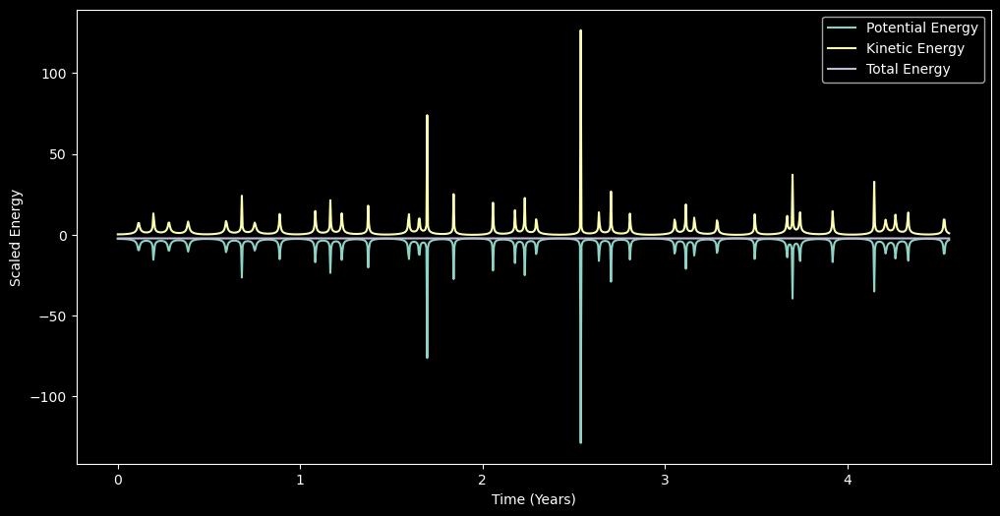

In [576]:
## Compute the potential energy of the system 

def calculate_potential(x1, y1, x2, y2, x3, y3, m1, m2, m3, G = 1):
    r12 = np.sqrt((x2-x1)**2 + (y2-y1)**2)
    r13 = np.sqrt((x3-x1)**2 + (y3-y1)**2)
    r23 = np.sqrt((x2-x3)**2 + (y2-y3)**2)
    return -G * (m1 * m2 / r12 + m1 * m3 / r13 + m2 * m3 / r23)

def calculate_kinetic(vx1, vy1, vx2, vy2, vx3, vy3, m1, m2, m3):
    return 0.5 * (m1 * (vx1**2 + vy1**2) + m2 * (vx2**2 + vy2**2) + m3 * (vx3**2 + vy3**2))

# Calculate energies
U = calculate_potential(x1, y1, x2, y2, x3, y3, m1, m2, m3)
K = calculate_kinetic(sol.y[6], sol.y[7], sol.y[8], sol.y[9], sol.y[10], sol.y[11], m1, m2, m3)
total_energy = U + K

tt = 1/np.sqrt(6.67e-11 * 1.99e30 / (1.5e11)**3 ) # seconds
tt = tt / (60*60 * 24* 365.25) * np.diff(t)[0] # per time step (in years)
T = tt * np.array([i for i in range(0, len(t))] ) 

# Plot energies
plt.figure(figsize=(12, 6))
plt.plot(T, U, label='Potential Energy')
plt.plot(T, K, label='Kinetic Energy')
plt.plot(T, total_energy, label='Total Energy')
plt.xlabel('Time (Years)')
plt.ylabel('Scaled Energy')
plt.legend()
plt.show()


### Converting the solution to proper time and animating the result 

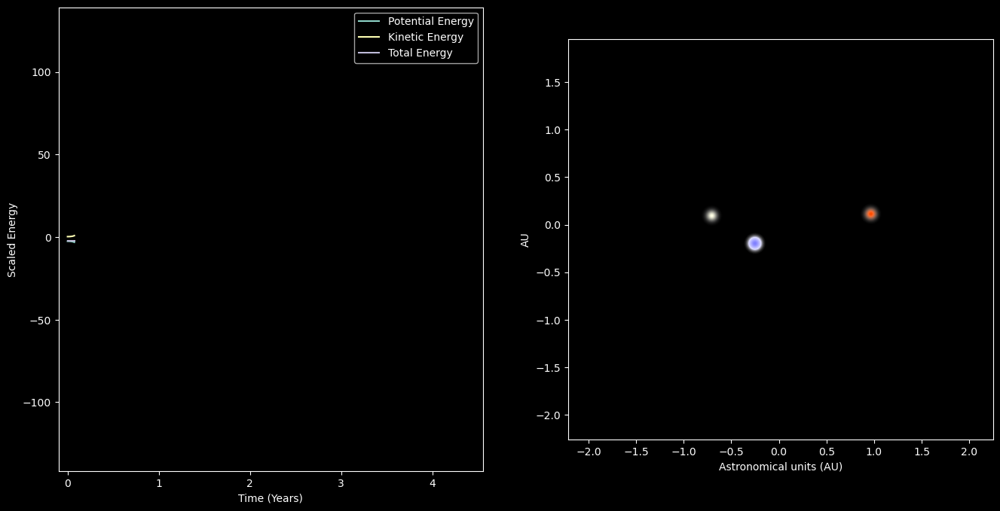

In [823]:
from matplotlib.colors import LinearSegmentedColormap

# Define the colors for the custom colormaps
colors1 = [(1, 1, 1, 0), (0.5, 0.5, 1, 3.6)]
colors2 = [(1, 1, 1, 0), (1, 0.3, 0, 1.2)]
colors3 = [(1, 1, 1, 0), (1, 1, 0.9, 1)]

# Create custom colormaps
cmap_name1 = 'custom_blue'
cmap1 = LinearSegmentedColormap.from_list(cmap_name1, colors1, N=256)
cmap_name2 = 'custom_orange'
cmap2 = LinearSegmentedColormap.from_list(cmap_name2, colors2, N=256)
cmap_name3 = 'custom_white'
cmap3 = LinearSegmentedColormap.from_list(cmap_name3, colors3, N=256)

# Center positions
center_x1, center_y1 = 0, 0
center_x2, center_y2 = 0, 0
center_x3, center_y3 = 0, 0

# Standard deviations
sigma_x = 0.04
sigma_y = 0.04

xmin, xmax = -2, 2
ymin, ymax = -2, 2

# Create a grid of points using Gaussian values and coloring to enact 'stars'
x, y = np.meshgrid(np.linspace(xmin, xmax, 500), np.linspace(ymin, ymax, 500))
r = np.sqrt((x - center_x1)**2 + (y - center_y1)**2)  # Radial distance
z = np.exp(-((x - center_x1)**2 / (2 * sigma_x**2) + (y - center_y1)**2 / (2 * sigma_y**2))) # Calculate the initial 2D Gaussian values
z[r > 3 * sigma_x] = np.nan # Mask values beyond 2.5 standard deviations

## Set up the figures
fig, ax = plt.subplots(1, 2, figsize=(16, 8))
# Set the first plot first 
ax[0].set_ylim(1.1 * min(U), max(K) * 1.1)  # Set y-axis limit for energy plot
ax[0].set_xlim(-0.1, max(T))  # Set initial x-axis limit for energy plot
ax[0].set_xlabel('Time (Years)') 
ax[0].set_ylabel('Scaled Energy')
line_U, = ax[0].plot([], [], label='Potential Energy')
line_K, = ax[0].plot([], [], label='Kinetic Energy')
line_total, = ax[0].plot([], [], label='Total Energy')
ax[0].legend()


max_limits_y = max(max(y1[:]), max(y2[:]), max(y3[:]))
min_limits_y = min(min(y1[:]), min(y2[:]), min(y3[:]))
max_limits_x = max(max(x1[:]), max(x2[:]), max(x3[:]))
min_limits_x = min(min(x1[:]), min(x2[:]), min(x3[:]))


# Set the second plot params
ax[1].set_ylim(-1 + min_limits_y, max_limits_y + 1)
ax[1].set_xlim(-1 + min_limits_x, max_limits_x + 1)
ax[1].set_xlabel('Astronomical units (AU)') 
ax[1].set_ylabel('AU') 
ln1 = ax[1].imshow(z, cmap=cmap1, extent=[xmin, xmax, ymin, ymax], origin='lower', zorder=3)
ln2 = ax[1].imshow(z, cmap=cmap2, extent=[xmin, xmax, ymin, ymax], origin='lower', zorder=3)
ln3 = ax[1].imshow(z, cmap=cmap3, extent=[xmin, xmax, ymin, ymax], origin='lower', zorder=3)

def animate_plot(fr):
    line_U.set_data(T[:fr], U[:fr])
    line_K.set_data(T[:fr], K[:fr])
    line_total.set_data(T[:fr], total_energy[:fr])
    
    # Update center positions based on the trajectories
    new_center_x1, new_center_y1 = x3[fr], y3[fr]
    new_center_x2, new_center_y2 = x2[fr], y2[fr]
    new_center_x3, new_center_y3 = x1[fr], y1[fr]
    
    # Update the Gaussian distributions based on the new center positions
    new_z1 = np.exp(-((x - new_center_x1)**2 / (2 * sigma_x**2) + (y - new_center_y1)**2 / (2 * sigma_y**2)))
    new_z2 = np.exp(-((x - new_center_x2)**2 / (2 * sigma_x**2) + (y - new_center_y2)**2 / (2 * sigma_y**2)))
    new_z3 = np.exp(-((x - new_center_x3)**2 / (2 * sigma_x**2) + (y - new_center_y3)**2 / (2 * sigma_y**2)))
    
    
    ln1.set_data(new_z1)
    ln2.set_data(new_z2) 
    ln3.set_data(new_z3)
    
    return line_U, line_K, line_total, ln1, ln2, ln3

ani_3body = animation.FuncAnimation(fig, animate_plot, frames= 20, interval=45, blit=True)
ani_3body.save('plan.gif', writer='pillow', fps=35)

plt.show() # Prevents double display of the animation
# Display the animation in the notebook
# HTML(ani_3body.to_jshtml())